## Load Libraries

In [1]:
import pandas as pd
import numpy as np
import torch
import os
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from starfysh import (AA, utils, plot_utils, post_analysis)
from starfysh import starfysh as sf_model

import warnings
warnings.filterwarnings('ignore')

## Load Data and Marker Genes

In [2]:
# Define file paths and identifiers for data analysis
data_path = 'C:/Users/fyl/OneDrive - Teesside University/Dissertation/Starfysh/Dataset'
sample_id = 'CID44971_TNBC'
sig_name = 'bc_signatures_version_1013.csv'

In [3]:
# Load expression counts
adata, adata_normed = utils.load_adata(data_folder=data_path,
                                       sample_id=sample_id, # sample id
                                       n_genes=2000  # number of highly variable genes to keep
                                       )

[2024-12-14 00:21:24] Preprocessing1: delete the mt and rp
[2024-12-14 00:21:24] Preprocessing2: Normalize
[2024-12-14 00:21:24] Preprocessing3: Logarithm
[2024-12-14 00:21:24] Preprocessing4: Find the variable genes


In [4]:
# Load  signature gene sets
gene_sig = pd.read_csv(os.path.join(data_path, sig_name))

# Filter signaature gene set to include only relevant genes present in the dataset
gene_sig = utils.filter_gene_sig(gene_sig, adata.to_df())

# View dataframe
gene_sig.head()

,Basal,LumA,LumB,MBC,Normal epithelial,Tcm,Tem,Tfh,Treg,Activated CD8,...,Plasmablasts,MDSC,Monocytes,cDC,pDC,CAFs MSC iCAF-like,CAFs myCAF-like,PVL differentiated,PVL immature,Endothelial
0,EMP1,SH3BGRL,UGCG,COL11A2,KRT14,CCR7,IL7R,CXCL13,TNFRSF4,CD69,...,IGKV3-15,ITGAM,LYZ,CD80,IL3RA,APOD,COL1A1,ACTA2,CCL19,ACKR1
1,TAGLN,HSPB1,ARMT1,SDC1,KRT17,LTB,ANXA1,NMB,LTB,CCR7,...,IGHG1,CD33,IL1B,CD86,LILRA4,DCN,COL1A2,TAGLN,RGS5,FABP4
2,TTYH1,PHGR1,ISOC1,FBN2,LTF,IL7R,CXCR4,NR3C1,IL32,CD27,...,IGKV1-5,ARG1,G0S2,CCR7,CD123,PTGDS,COL3A1,MYL9,IGFBP7,PLVAP
3,RTN4,SOX9,GDF15,MMP1,KRT15,SARAF,KLRB1,DUSP4,BATF,BTLA,...,IGKV3-20,NOS2,TYROBP,CD1A,TCF4,CFD,LUM,TPM2,NDUFA4L2,RAMP2
4,TK1,CEBPD,ZFP36,FABP5,PTN,SELL,TNFAIP3,TNFRSF18,FOXP3,CD40LG,...,IGKV3-11,CD68,FCN1,CD1C,IRF7,LUM,SFRP2,NDUFA4L2,CCL2,VWF


In [5]:
# View Anndata
adata

AnnData object with n_obs × n_vars = 1162 × 18954
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'features', 'highly_variable'

... storing 'sample' as categorical


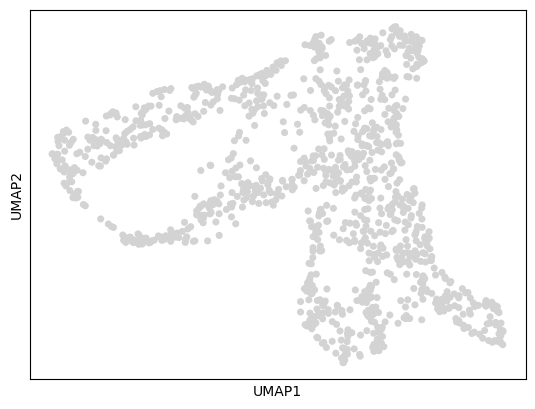

In [6]:
# Load spatial information (preprocess image)
img_metadata = utils.preprocess_img(
    data_path=data_path,
    sample_id=sample_id,
    adata_index=adata.obs.index,
    hchannel=False
)

# Extract the spatial information: image, map, and scale factor
img, map_info, scalefactor = img_metadata.get('img'), img_metadata.get('map_info'), img_metadata.get('scalefactor')

# Display UMAP (by calling the function directly)
umap_df = utils.get_umap(adata, display=True)

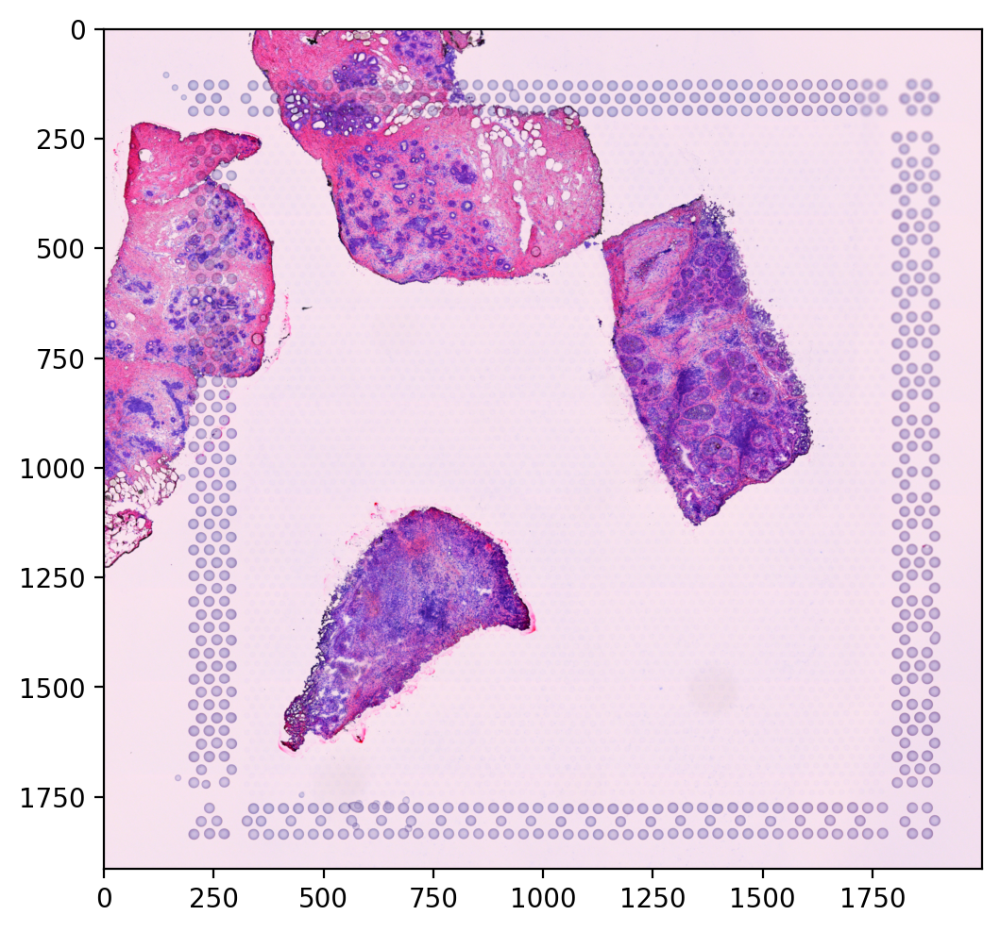

In [7]:
# Display tissue image
plt.figure(figsize=(6, 6), dpi=200)
plt.imshow(img)
plt.show()

In [8]:
# Preview map_info dataframe
map_info.head()

,array_row,array_col,imagerow,imagecol,sample
AACATTGGTCAGCCGT-1,3,17,1361,2511,CID44971_TNBC
CATCGAATGGATCTCT-1,3,19,1361,2620,CID44971_TNBC
CGGGTTGTAGCTTTGG-1,3,21,1361,2730,CID44971_TNBC
CCTAAGTGTCTAACCG-1,2,22,1266,2784,CID44971_TNBC
TCTGTGACTGACCGTT-1,3,23,1361,2839,CID44971_TNBC


In [9]:
# Parameters for training
visium_args = utils.VisiumArguments(adata,
                                    adata_normed,
                                    gene_sig,
                                    img_metadata,
                                    n_anchors=10,
                                    window_size=3,
                                    sample_id=sample_id
                                   )

adata, adata_normed = visium_args.get_adata()
anchors_df = visium_args.get_anchors()

[2024-12-14 00:21:35] Subsetting highly variable & signature genes ...
[2024-12-14 00:21:45] Smoothing library size by taking averaging with neighbor spots...
[2024-12-14 00:21:46] Retrieving & normalizing signature gene expressions...


       'HLA.DPB1'],
      dtype='object')
       'CH17-224D4.2', 'IGKV1-8', 'IGLV4-69', 'IGKV1-16', 'IGKV3D-11',
       'IGHV3-15'],
      dtype='object')
       'CD172A'],
      dtype='object')


[2024-12-14 00:21:52] Identifying anchor spots (highly expression of specific cell-type signatures)...


In [10]:
adata.shape

(1162, 2599)

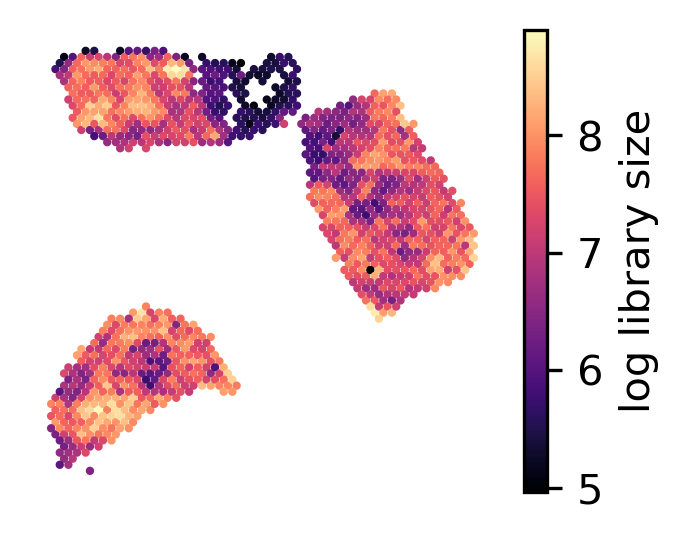

In [11]:
# Visualize spatial image
plot_utils.plot_spatial_feature(
    map_info,                 # Spatial information (map data)
    visium_args.log_lib,      # The variable (log library size) you want to plot
    label='log library size', # Label for the plot
    #vmin=None,                # Optional min value for scaling
    #vmax=None,                # Optional max value for scaling
    #figsize=(2.5, 2)          # Optional figsize
)

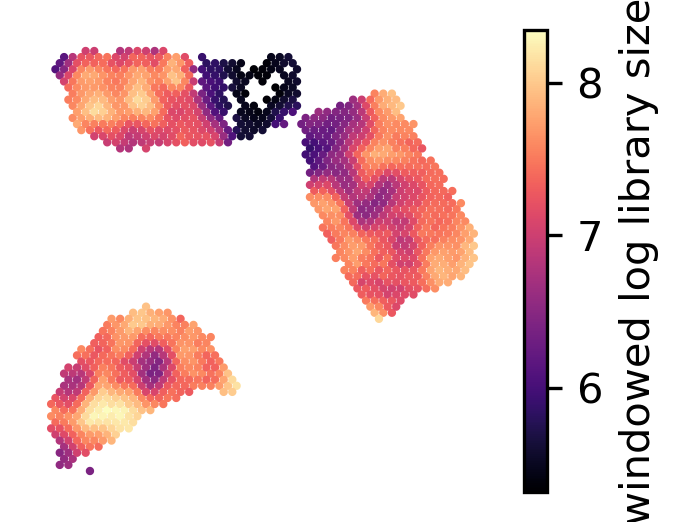

In [12]:
plot_utils.plot_spatial_feature(                                
                                map_info,
                                visium_args.win_loglib,
                                label='windowed log library size',
                                )

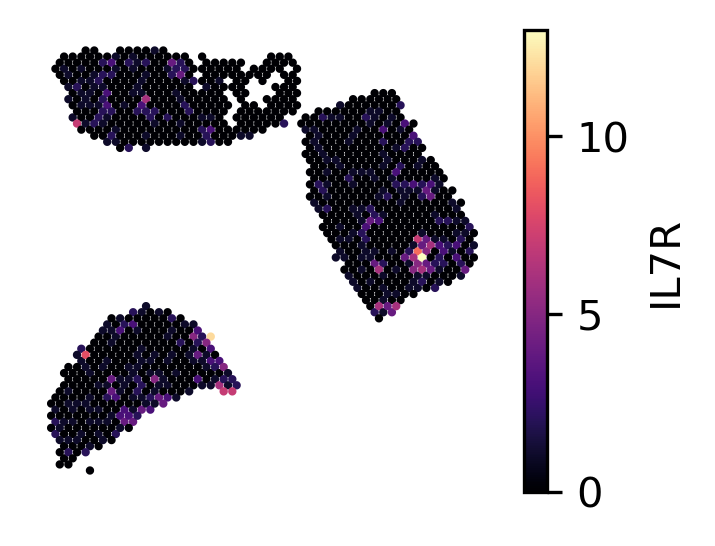

In [13]:
# Visualize spatial expression of a specific gene
plot_utils.plot_spatial_gene(adata, 
                             map_info,
                             gene_name='IL7R')

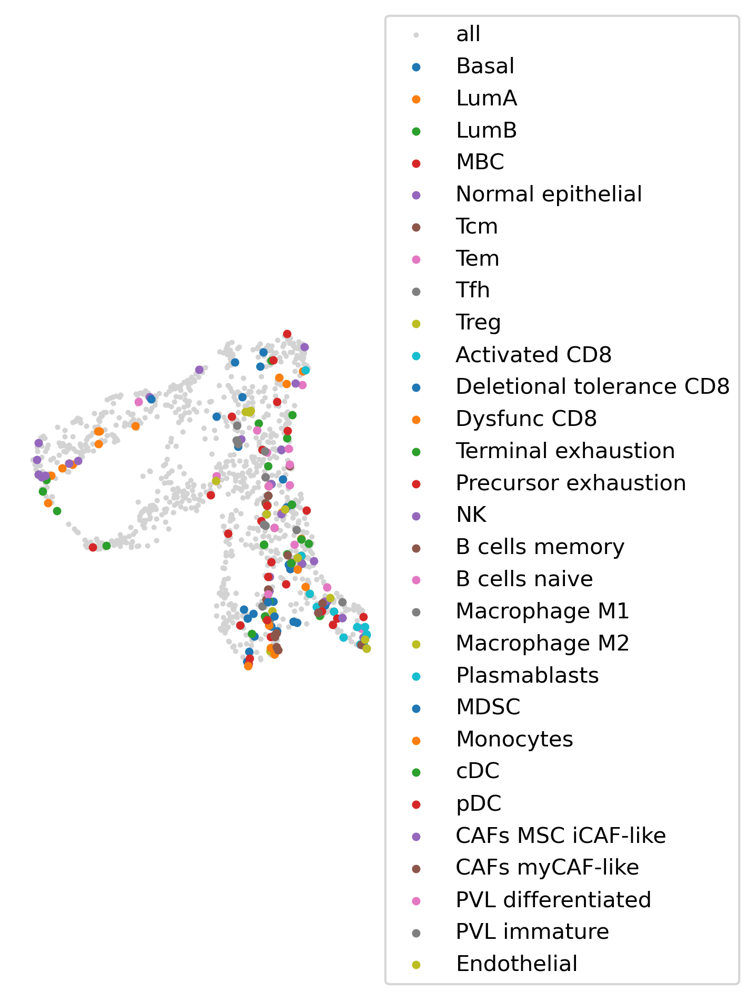

In [14]:
# Plotting Anchor Spots with UMAP and Signature mean analysis
plot_utils.plot_anchor_spots(umap_df,
                             visium_args.pure_spots,
                             visium_args.sig_mean,
                             bbox_x=2
                            )

## Run Starfysh

### Model Parameters

In [15]:
n_repeats = 3
epochs = 200
patience = 50
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Model Training

#### Base Starfysh deconvolution with ST expression matrix

In [16]:
# Run models
model, loss = utils.run_starfysh(visium_args,
                                 n_repeats=n_repeats,
                                 epochs=epochs,
                                 #patience=patience,
                                 device=device
                                )

[2024-12-14 00:21:53] Running Starfysh with 3 restarts, choose the model with best parameters...
[2024-12-14 00:21:53] Initializing model parameters...
[2024-12-14 00:22:14] Epoch[10/200], train_loss: 3851.4733, train_reconst: 3647.9350, train_u: 18.0036,train_z: 29.1103,train_c: 129.3604,train_l: 27.0639
[2024-12-14 00:22:40] Epoch[20/200], train_loss: 2086.7719, train_reconst: 1925.2323, train_u: 17.9381,train_z: 26.1626,train_c: 115.0163,train_l: 2.4227
[2024-12-14 00:23:10] Epoch[30/200], train_loss: 1739.0641, train_reconst: 1588.5741, train_u: 17.8715,train_z: 24.2139,train_c: 107.3613,train_l: 1.0434
[2024-12-14 00:23:37] Epoch[40/200], train_loss: 1696.4632, train_reconst: 1551.9319, train_u: 17.8166,train_z: 22.5913,train_c: 102.8103,train_l: 1.3131
[2024-12-14 00:24:05] Epoch[50/200], train_loss: 1672.7450, train_reconst: 1532.1076, train_u: 17.7714,train_z: 20.9957,train_c: 100.3554,train_l: 1.5148
[2024-12-14 00:24:33] Epoch[60/200], train_loss: 1658.8025, train_reconst: 15

[2024-12-14 00:46:25] Epoch[120/200], train_loss: 1626.4234, train_reconst: 1492.1607, train_u: 17.6213,train_z: 19.5505,train_c: 94.9977,train_l: 2.0931
[2024-12-14 00:46:53] Epoch[130/200], train_loss: 1632.6015, train_reconst: 1498.4529, train_u: 17.6123,train_z: 19.1768,train_c: 95.2194,train_l: 2.1401
[2024-12-14 00:47:14] Epoch[140/200], train_loss: 1629.7939, train_reconst: 1496.1784, train_u: 17.6052,train_z: 18.8774,train_c: 94.9577,train_l: 2.1753
[2024-12-14 00:47:38] Epoch[150/200], train_loss: 1624.0870, train_reconst: 1490.4925, train_u: 17.5991,train_z: 18.8530,train_c: 94.9432,train_l: 2.1991
[2024-12-14 00:47:59] Epoch[160/200], train_loss: 1622.7257, train_reconst: 1489.0923, train_u: 17.5944,train_z: 19.0329,train_c: 94.7712,train_l: 2.2349
[2024-12-14 00:48:20] Epoch[170/200], train_loss: 1627.5551, train_reconst: 1493.9196, train_u: 17.5905,train_z: 18.8795,train_c: 94.9154,train_l: 2.2502
[2024-12-14 00:48:41] Epoch[180/200], train_loss: 1622.2405, train_reconst: 

#### Starfysh deconvolution with histology integration

In [17]:
# Run Model using Product of Expert (PoE) model 
model_hist, loss_poe = utils.run_starfysh(visium_args,
                                     n_repeats=n_repeats,
                                     epochs=epochs,
                                     poe=True,
                                     device=device)

[2024-12-14 00:49:26] Running Starfysh with 3 restarts, choose the model with best parameters...
[2024-12-14 00:49:28] Initializing model parameters...
[2024-12-14 00:50:10] Epoch[10/200], train_loss: 16392.4497, train_reconst: 16148.5841, train_u: 18.0489,train_z: 54.5651,train_c: 142.1821,train_l: 29.0695
[2024-12-14 00:50:53] Epoch[20/200], train_loss: 14891.2804, train_reconst: 14692.3722, train_u: 18.0160,train_z: 48.9434,train_c: 127.5080,train_l: 4.4406
[2024-12-14 00:51:36] Epoch[30/200], train_loss: 14549.8617, train_reconst: 14364.6340, train_u: 17.9907,train_z: 46.7337,train_c: 119.5604,train_l: 0.9427
[2024-12-14 00:52:17] Epoch[40/200], train_loss: 14447.6701, train_reconst: 14268.5080, train_u: 17.9716,train_z: 45.2828,train_c: 114.8870,train_l: 1.0208
[2024-12-14 00:53:02] Epoch[50/200], train_loss: 14403.6356, train_reconst: 14228.8414, train_u: 17.9566,train_z: 43.2092,train_c: 112.4478,train_l: 1.1807
[2024-12-14 00:53:44] Epoch[60/200], train_loss: 14311.5147, train_

[2024-12-14 01:33:24] Epoch[110/200], train_loss: 14172.0146, train_reconst: 14007.2233, train_u: 17.9108,train_z: 39.3862,train_c: 105.9244,train_l: 1.5698
[2024-12-14 01:34:23] Epoch[120/200], train_loss: 14146.7689, train_reconst: 13981.8762, train_u: 17.9074,train_z: 39.5404,train_c: 105.8476,train_l: 1.5971
[2024-12-14 01:35:21] Epoch[130/200], train_loss: 14132.4844, train_reconst: 13967.8819, train_u: 17.9044,train_z: 39.2389,train_c: 105.8294,train_l: 1.6298
[2024-12-14 01:36:18] Epoch[140/200], train_loss: 14122.2345, train_reconst: 13958.6844, train_u: 17.9018,train_z: 38.5945,train_c: 105.4021,train_l: 1.6516
[2024-12-14 01:37:17] Epoch[150/200], train_loss: 14103.1703, train_reconst: 13940.1715, train_u: 17.8997,train_z: 38.4404,train_c: 104.9786,train_l: 1.6800
[2024-12-14 01:38:14] Epoch[160/200], train_loss: 14114.6674, train_reconst: 13950.8985, train_u: 17.8979,train_z: 38.3319,train_c: 105.8284,train_l: 1.7107
[2024-12-14 01:39:13] Epoch[170/200], train_loss: 14103.71

### Downstream analysis

#### Base Starfysh Deconvolution
##### Parse Starfysh inference output

In [18]:
# Loading data and evaluationg the spatial framework model 
adata, adata_normed = visium_args.get_adata()
inference_outputs, generative_outputs = sf_model.model_eval(model,
                                                            adata,
                                                            visium_args,
                                                            poe=False,
                                                            device=device)

##### Visualize starfysh deconvoluion results
##### Gene signature mean vs inferred proportions

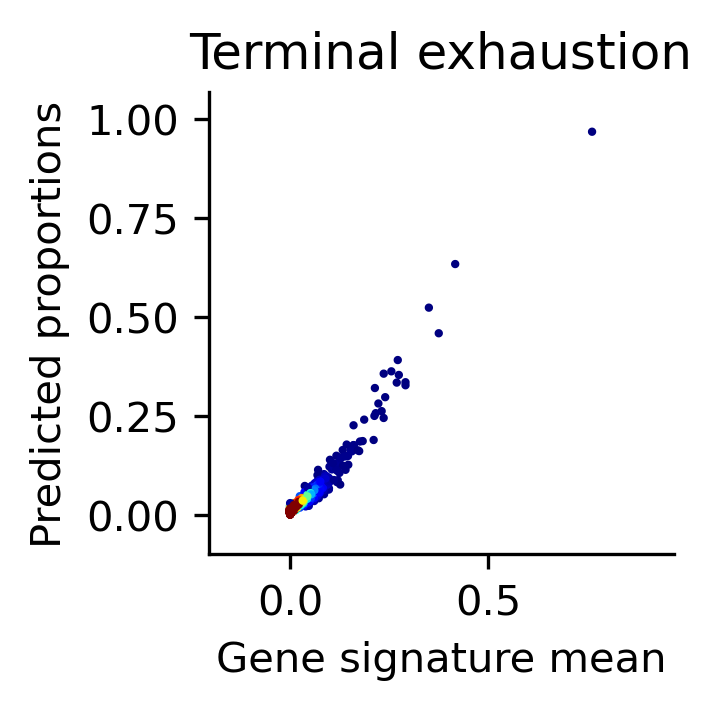

In [19]:
n_cell_types = gene_sig.shape[1]
idx = np.random.randint(0, n_cell_types)
post_analysis.gene_mean_vs_inferred_prop(inference_outputs,
                                         visium_args,
                                         idx=idx
                                        )

##### Spatial Visualisations
##### Inferred density on Spatial map

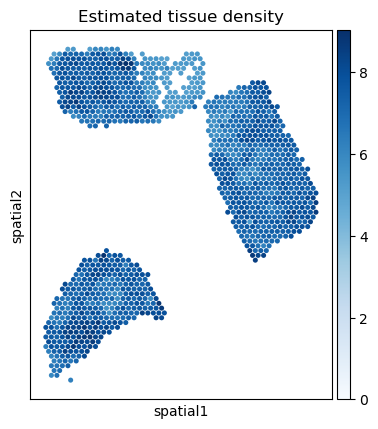

In [20]:
plot_utils.pl_spatial_inf_feature(adata, feature='ql_m', cmap='Blues')

##### Inferred cell-type proportions (spatial map)

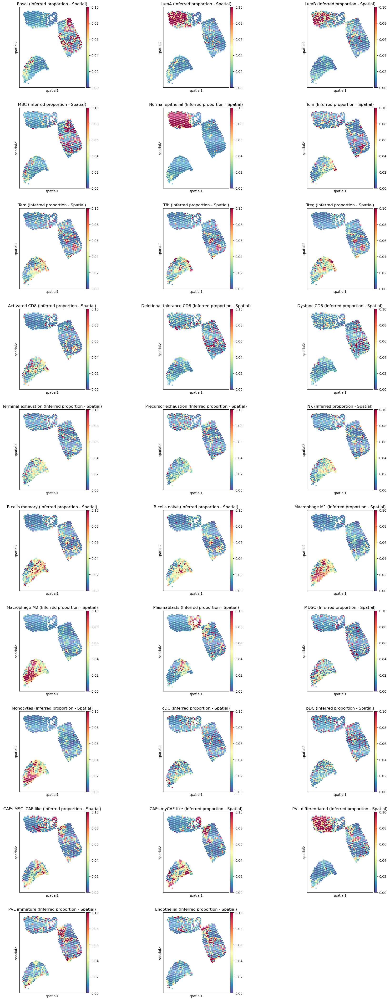

In [21]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qc_m',
                                  # To display for specific cell types:
                                  # factor = cell type or factor = [cell type1, ...]
                                  vmax=0.1)

##### Inferred cell-type proportions on Z-space (UMAP)

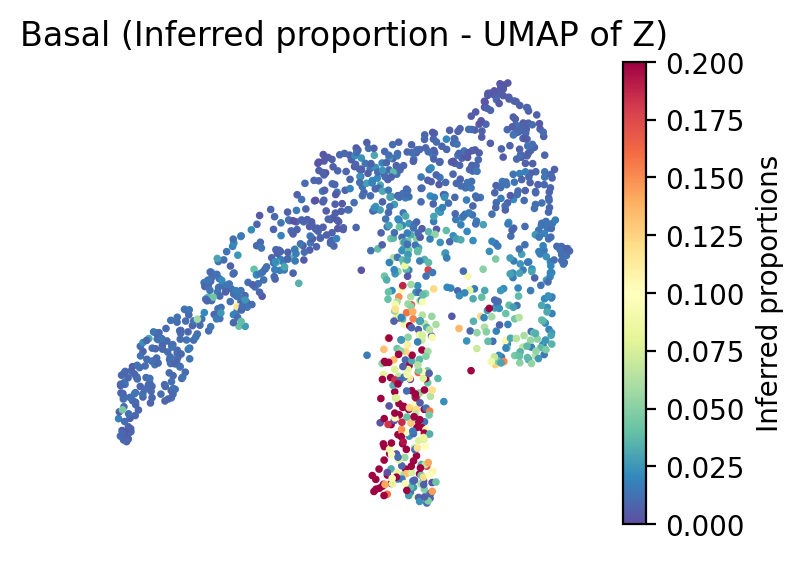

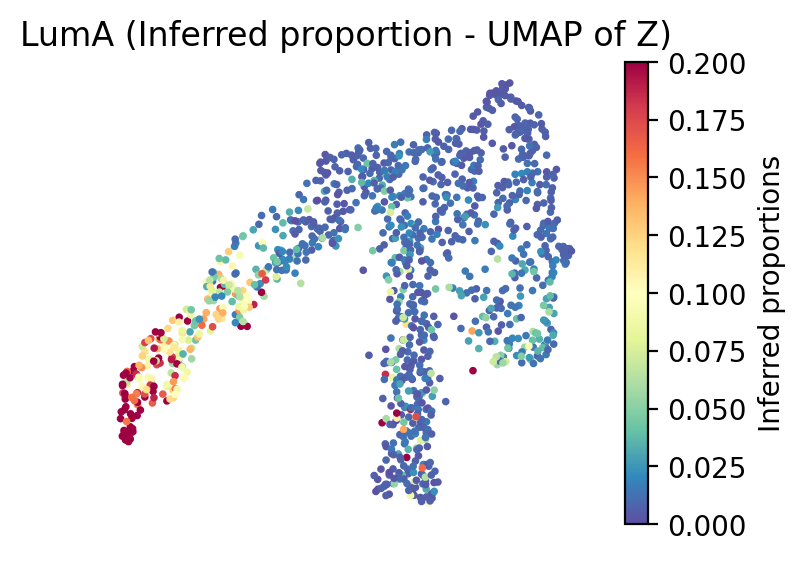

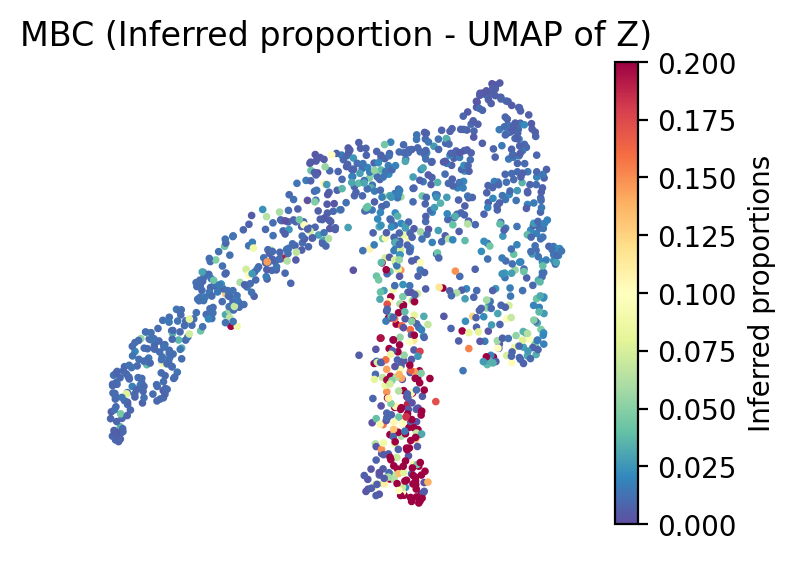

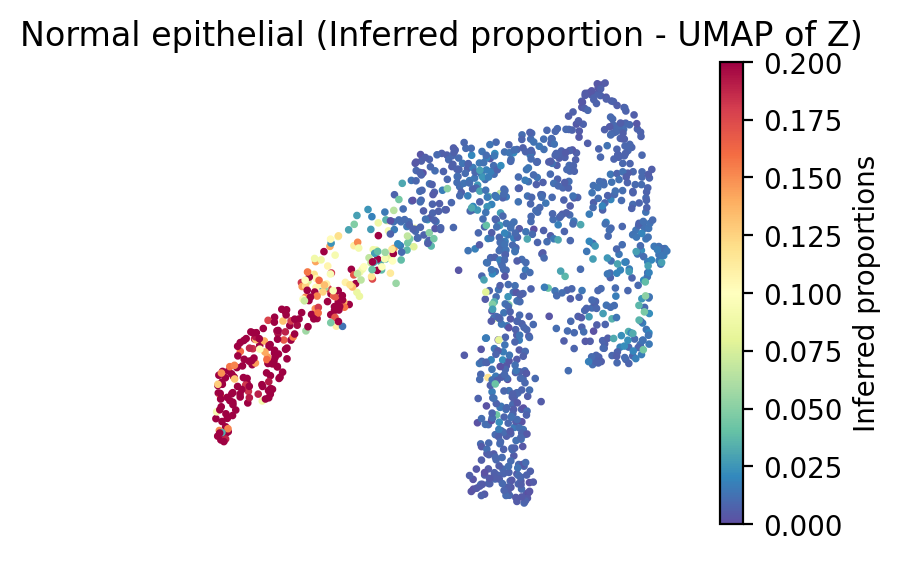

In [22]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qz_m',
                                  # To display for specific cell types:
                                  # factor = Cell type or factor = [Cell type1, ...]
                                  factor=['Basal', 'LumA', 'MBC', 'Normal epithelial'],
                                  spot_size=3,
                                  vmax=0.2)

##### Infer cell-type specific expressions from each spot

In [23]:
pred_exprs = sf_model.model_ct_exp(model,
                                   adata,
                                   visium_args,
                                   device=device)

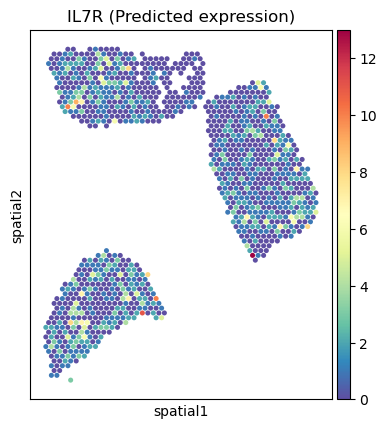

In [24]:
# Plot spot-level expression (e.g. IL7R from Effector Memory T cells (Tem))
sample_gene = 'IL7R'
sample_cell_type = 'Tem'

plot_utils.pl_spatial_inf_gene(adata,
                               factor=sample_cell_type,
                               feature=sample_gene)

#### Starfysh Deconvolution with Histology Integration

##### Parse Starfysh Inference outputs

In [25]:
inference_outputs_poe, generative_outputs_poe = sf_model.model_eval(model_hist,
                                                                    adata,
                                                                    visium_args,
                                                                    poe=True,
                                                                    device=device)

#### Visualize Starfysh deconvolution results
##### Gene signature mean vs inferred proportion

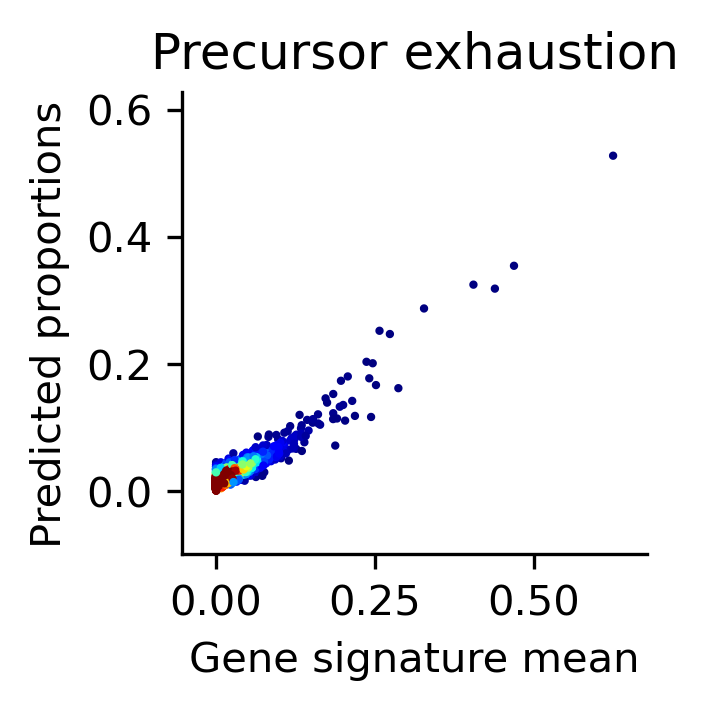

In [26]:
n_cell_types = gene_sig.shape[1]
idx = np.random.randint(0, n_cell_types)
post_analysis.gene_mean_vs_inferred_prop(inference_outputs_poe,
                                         visium_args,
                                         idx=idx
                                        )

##### Spatial visualisations

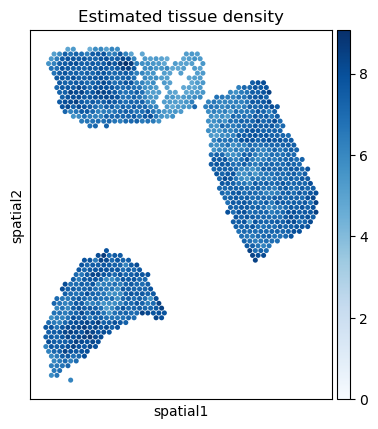

In [27]:
plot_utils.pl_spatial_inf_feature(adata, feature='ql_m', cmap='Blues')

##### Inferred cell-type proportions (spatial map)

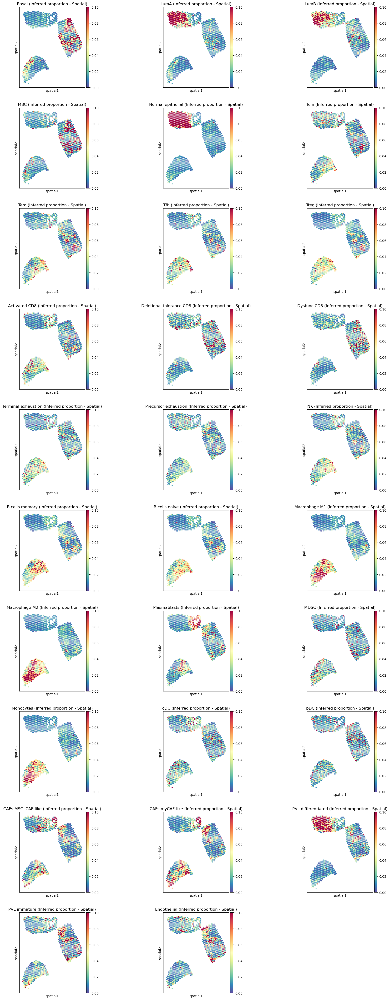

In [28]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qc_m',
                                  # To display for specific cell types:
                                  # factor = cell type or factor = [cell type1, ...]
                                  vmax=0.1)

##### Inferred cell-type proportions on Z-space (UMAP)

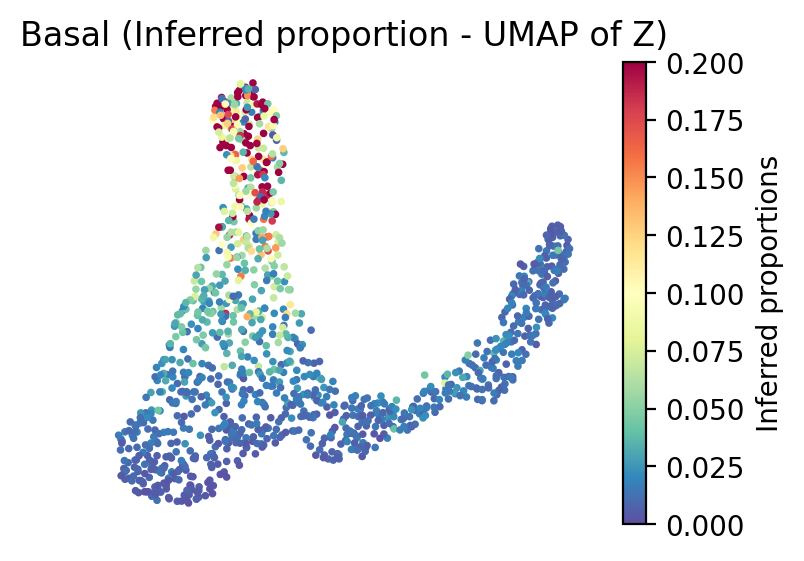

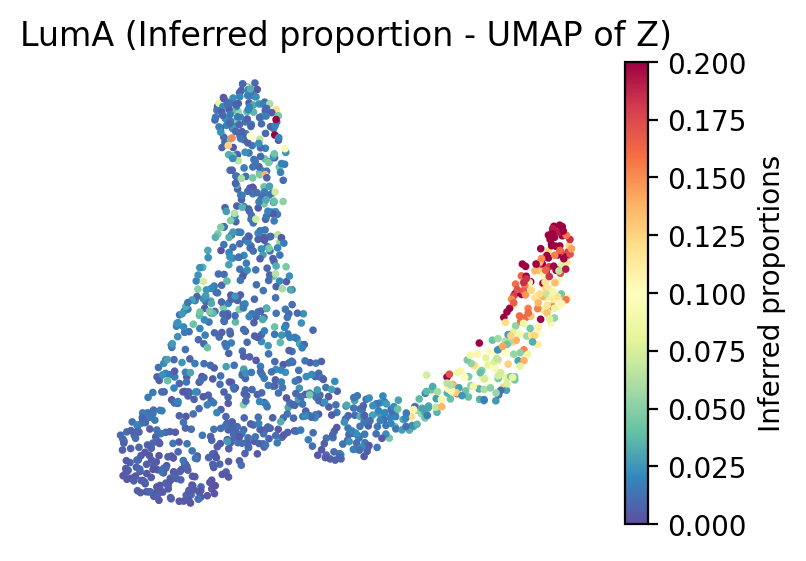

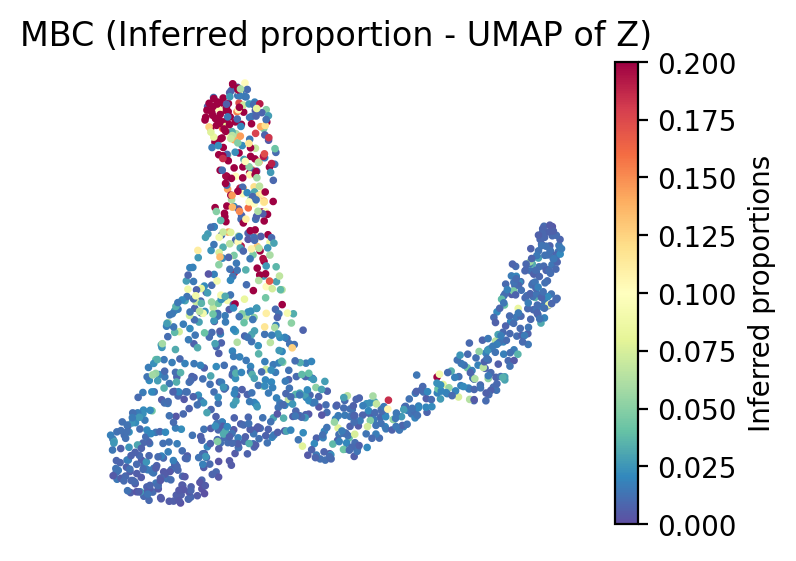

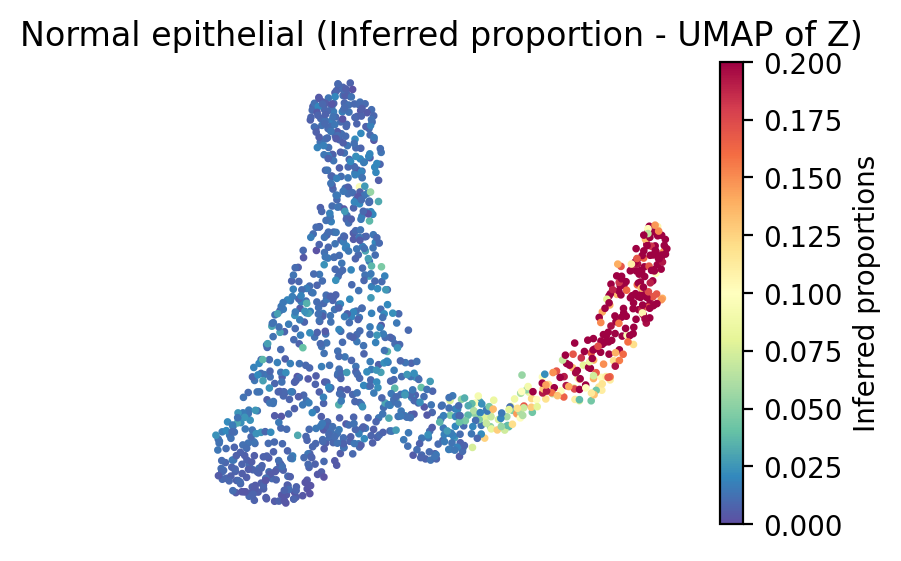

In [29]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qz_m',
                                  # To display for specific cell types:
                                  # factor = Cell type or factor = [Cell type1, ...]
                                  factor=['Basal', 'LumA', 'MBC', 'Normal epithelial'],
                                  vmax=0.2)

##### Infer cell-type specific expressions from each spot

In [30]:
pred_exprs = sf_model.model_ct_exp(model_hist,
                                   adata,
                                   visium_args,
                                   #poe=True,
                                   device=device)

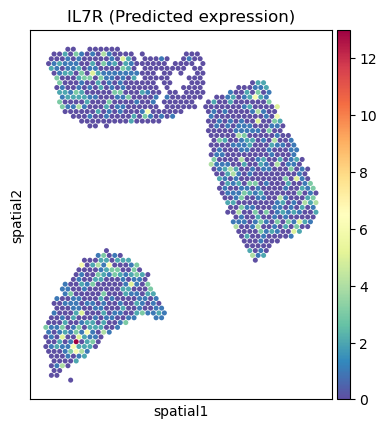

In [31]:
#Plot spot-level expression (e.g. IL7R from Effector Memory T cells (Tem))
sample_gene = 'IL7R'
sample_cell_type = 'Tem'

plot_utils.pl_spatial_inf_gene(adata,
                               factor=sample_cell_type,
                               feature=sample_gene)

#### Save model & inferred parameters

In [32]:
# Specify output directory
outdir = os.path.join(data_path, 'results')  # This creates a 'results' folder in the same directory as `data_path`
if not os.path.exists(outdir):
    os.mkdir(outdir)

# Save the base model
torch.save(model.state_dict(), os.path.join(outdir, 'starfysh_model_3_10.pt'))

# Save the PoE-trained model (model_hist)
torch.save(model_hist.state_dict(), os.path.join(outdir, 'starfysh_model_hist_3_10.pt'))

# Save `adata` object with inferred parameters
adata.write(os.path.join(outdir, 'st_3_10.h5ad'))